In [1]:
import pandas as pd
import geopandas as gpd
import folium
import geopy
from geopy.distance import geodesic
from shapely.geometry import Point
import branca.colormap as cm
from ipywidgets import interact_manual, widgets, VBox, HBox
import ipywidgets as widgets
from sklearn.preprocessing import MinMaxScaler
import zipfile
from shapely import wkt

pd.set_option('display.max_columns', None)
# https://basedosdados.org/dataset/08a1546e-251f-4546-9fe0-b1e6ab2b203d?table=9066097f-207e-44e0-9ed1-67f12b51e28d
# https://basedosdados.org/dataset/08a1546e-251f-4546-9fe0-b1e6ab2b203d?table=9066097f-207e-44e0-9ed1-67f12b51e28d
# SELECT 
#     id_distrito, id_subdistrito, id_setor_censitario, cep,
#     id_endereco, localidade, tipo_segmento_logradouro,
#     nome_logradouro, complemento_elemento_1, tipo_finalidade_construcao,
#     tipo_estabelecimento, tipo_construcao, descricao_estabelecimento, 
#     tipo_especie, ponto, tipo_edificacao_domicilio  
# FROM `basedosdados.br_ibge_censo_2022.cadastro_enderecos`  
# WHERE id_municipio = '3550308';

### ESTUDAR CLUSTERIZAÇÃO PARA TENTAR AGRUPAR PADRÕES


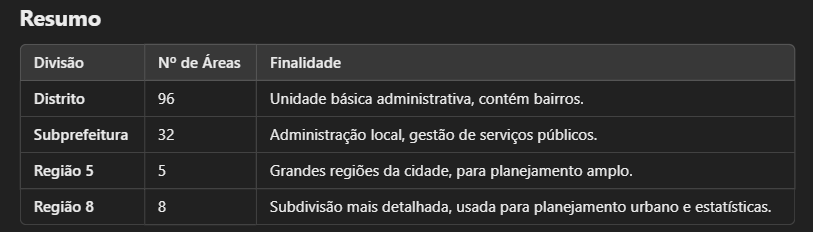

In [2]:
estacoes = pd.read_parquet("estacoes_reestruturadas.parquet")
### estabelecimentos eh criterios fisicos
# populacao_2 = pd.read_csv("./Agregados_por_CEP_CNEFE_Censo_2022/Agregados_por_CEP_CNEFE_Censo_2022.csv", sep=";")

## Região 8

In [3]:
shapefile_path = "./REGIAO8/SIRGAS_REGIAO8.shp"
# Carregar o shapefile
regiao_8 = gpd.read_file(shapefile_path)


In [4]:
# populacao_2.shape[0]
regiao_8


,ID,AREA,COD_REG_8,NOME,geometry
0,1,128.316528,5,Norte 1,"POLYGON ((330950.322 7407837.196, 330952.146 7..."
1,2,134.872360,2,Leste 1,"POLYGON ((341181.523 7399158.975, 341201.503 7..."
2,3,197.469162,3,Leste 2,"POLYGON ((346822.464 7402876.341, 347219.638 7..."
3,4,78.791351,7,Sul 1,"POLYGON ((338856.928 7388652.872, 338860.455 7..."
4,5,663.415710,8,Sul 2,"POLYGON ((333665.997 7381001.340, 333682.527 7..."
5,6,129.293335,6,Oeste,"POLYGON ((321265.384 7388006.606, 321265.980 7..."
6,7,172.282059,4,Norte 2,"POLYGON ((320686.024 7400568.909, 320685.282 7..."
7,8,26.727596,1,Centro,"POLYGON ((331140.541 7398297.770, 331237.990 7..."


## Região 5

In [5]:
shapefile_path = "./REGIAO5/SAD69-96_REGIAO5.shp"
# Carregar o shapefile
regiao_5 = gpd.read_file(shapefile_path)
regiao_5


,ID,AREA,COD_REG_5,NOME,geometry
0,1,331.492236,2,Leste,"POLYGON ((341226.585 7399204.690, 341246.565 7..."
1,4,299.872238,3,Norte,"POLYGON ((341226.585 7399204.690, 341207.720 7..."
2,2,740.469917,5,Sul,"POLYGON ((338901.991 7388698.601, 338905.518 7..."
3,3,128.988375,4,Oeste,"POLYGON ((321310.468 7388052.339, 321311.064 7..."
4,5,26.662624,1,Centro,"POLYGON ((331185.615 7398343.488, 331283.064 7..."


## Subprefeituras

In [6]:

shapefile_path = "./SIRGAS_SHP_subprefeitura/SIRGAS_SHP_subprefeitura_polygon.shp"
# Carregar o shapefile
subprefeituras = gpd.read_file(shapefile_path)

In [7]:
subprefeituras.head()

,sp_areamt,sp_areakmt,sp_codigo,sp_id,sp_sigla,sp_nome,geometry
0,31980202.74,32.0,03,2.0,FO,FREGUESIA-BRASILANDIA,"POLYGON ((327340.628 7399133.313, 327331.514 7..."
1,27232342.53,27.0,04,3.0,CV,CASA VERDE-CACHOEIRINHA,"POLYGON ((329084.795 7402363.669, 329086.123 7..."
2,40638699.56,41.0,08,13.0,LA,LAPA,"POLYGON ((321633.729 7393535.365, 321633.031 7..."
3,56889310.75,57.0,01,31.0,PR,PERUS,"POLYGON ((325464.932 7409329.344, 325464.513 7..."
4,26665465.09,27.0,09,14.0,SE,SE,"POLYGON ((330197.017 7396087.885, 330211.849 7..."


In [8]:
shapefile_path ="./SIRGAS_SHP_distrito/SIRGAS_SHP_distrito.shp"
# Carregar o shapefile
distritos = gpd.read_file(shapefile_path)

## Distritos

In [9]:
distritos

,ds_nome,ds_codigo,ds_cd_sub,ds_subpref,ds_sigla,ds_areamt,ds_areakm,geometry
0,MANDAQUI,51,05,SANTANA-TUCURUVI,MAN,13249456.11,13.249,"POLYGON ((333079.583 7408102.398, 333077.161 7..."
1,MOEMA,32,12,VILA MARIANA,MOE,9079516.47,9.080,"POLYGON ((331290.130 7392111.284, 331324.217 7..."
2,ARTUR ALVIM,5,21,PENHA,AAL,6505750.23,6.506,"POLYGON ((349420.638 7397694.618, 349423.468 7..."
3,IGUATEMI,33,30,SAO MATEUS,IGU,19434636.54,19.435,"POLYGON ((350874.784 7389641.837, 350875.630 7..."
4,ITAIM BIBI,35,11,PINHEIROS,IBI,10026327.68,10.026,"POLYGON ((327871.085 7386152.364, 327865.295 7..."
...,...,...,...,...,...,...,...,...
91,BUTANTA,12,10,BUTANTA,BUT,12952520.76,12.953,"POLYGON ((322140.524 7393133.295, 322137.103 7..."
92,CACHOEIRINHA,13,04,CASA VERDE-CACHOEIRINHA,CAC,13571736.73,13.572,"POLYGON ((330933.585 7402181.544, 330910.867 7..."
93,CAMBUCI,14,09,SE,CMB,3924676.72,3.925,"POLYGON ((334806.666 7391501.308, 334783.054 7..."
94,CAMPO GRANDE,16,14,SANTO AMARO,CGR,12936654.38,12.937,"POLYGON ((325612.963 7381815.938, 325634.233 7..."


## População

In [10]:
populacao = pd.read_csv("populacao_certa.csv")
dicionario_populacao = pd.read_csv("dicionario_populacao.csv")

In [11]:
dicionario_populacao

,id_tabela,nome_coluna,chave,cobertura_temporal,valor
0,cadastro_enderecos,tipo_especie,8,(1),Estabelecimento religioso
1,cadastro_enderecos,tipo_especie,7,(1),Edificação em construção ou reforma
2,cadastro_enderecos,tipo_especie,5,(1),Estabelecimento de saúde
3,cadastro_enderecos,tipo_especie,2,(1),Domicílio coletivo
4,cadastro_enderecos,tipo_especie,4,(1),Estabelecimento de ensino
5,cadastro_enderecos,tipo_especie,1,(1),Domicílio particular
6,cadastro_enderecos,tipo_especie,6,(1),Estabelecimento de outras finalidades
7,cadastro_enderecos,tipo_especie,3,(1),Estabelecimento agropecuário
8,cadastro_enderecos,tipo_construcao,3,(1),"Múltiplo, com mais de 10 unidades no endereço"
9,cadastro_enderecos,tipo_construcao,1,(1),Único


In [12]:
populacao.isnull().sum()

id_distrito                         0
id_subdistrito                      0
id_setor_censitario                 0
cep                                 0
id_endereco                         0
localidade                          0
tipo_segmento_logradouro            0
nome_logradouro                     0
complemento_elemento_1        2141961
tipo_finalidade_construcao    5603285
tipo_estabelecimento          5082113
tipo_construcao               5603182
descricao_estabelecimento     5078668
tipo_especie                        0
ponto                               0
tipo_edificacao_domicilio      692862
dtype: int64

In [13]:
populacao.head()

,id_distrito,id_subdistrito,id_setor_censitario,cep,id_endereco,localidade,tipo_segmento_logradouro,nome_logradouro,complemento_elemento_1,tipo_finalidade_construcao,tipo_estabelecimento,tipo_construcao,descricao_estabelecimento,tipo_especie,ponto,tipo_edificacao_domicilio
0,355030801,35503080100,355030801000112P,3180000,58852027,VILA CLAUDIA,RUA,FERNANDO FALCAO,NaN,NaN,1.0,NaN,FABRICA,6,POINT(-46.584128 -23.555116),NaN
1,355030804,35503080400,355030804000072P,3480080,58346874,VILA NOVA YORK,AVENIDA,ARRAIAS DO ARAGUAIA,NaN,NaN,1.0,NaN,OZAKAR AUTOMOVEIS,6,POINT(-46.502573 -23.57664),NaN
2,355030808,35503080800,355030808000056P,3175001,58800040,BELEM,RUA,SERRA DE JAIRE,NaN,NaN,1.0,NaN,DIGOTEC GAS,6,POINT(-46.581852 -23.552005),NaN
3,355030808,35503080800,355030808000106P,3175010,58737723,BELEM,RUA,SERRA DE JAIRE,FRENTE,NaN,1.0,NaN,ACAI E SORVETE,6,POINT(-46.587576 -23.545734),NaN
4,355030809,35503080900,355030809000096P,1120000,58810062,BOM RETIRO,RUA,JOSE PAULINO,NaN,NaN,1.0,NaN,LOJA DE ROUPA CHAVILLE,6,POINT(-46.639045 -23.531069),NaN


In [14]:
populacao.columns

Index(['id_distrito', 'id_subdistrito', 'id_setor_censitario', 'cep',
       'id_endereco', 'localidade', 'tipo_segmento_logradouro',
       'nome_logradouro', 'complemento_elemento_1',
       'tipo_finalidade_construcao', 'tipo_estabelecimento', 'tipo_construcao',
       'descricao_estabelecimento', 'tipo_especie', 'ponto',
       'tipo_edificacao_domicilio'],
      dtype='object')

In [15]:
populacao.isnull().sum()

id_distrito                         0
id_subdistrito                      0
id_setor_censitario                 0
cep                                 0
id_endereco                         0
localidade                          0
tipo_segmento_logradouro            0
nome_logradouro                     0
complemento_elemento_1        2141961
tipo_finalidade_construcao    5603285
tipo_estabelecimento          5082113
tipo_construcao               5603182
descricao_estabelecimento     5078668
tipo_especie                        0
ponto                               0
tipo_edificacao_domicilio      692862
dtype: int64

# Função de Estações

In [16]:
## Prepara o dataframe de estações para as outras análises
## Retorna o dataframe tratado
def tratar_df_estacoes(df_estacoes, regiao_5, regiao_8, subprefeituras):
    ## Cria uma geometria "Point"
    df_estacoes = gpd.GeoDataFrame(df_estacoes, geometry = gpd.points_from_xy(df_estacoes['lon'], df_estacoes['lat']))
    ## Define crs
    df_estacoes.set_crs("EPSG:4326", inplace = True)

    # Spatial Join com regiao_5
    df_estacoes = gpd.sjoin(df_estacoes, regiao_5[['geometry', 'COD_REG_5']], how='left', op='within')
    df_estacoes['COD_REG_5'] = df_estacoes['COD_REG_5'].fillna('Não Atribuído')
    # return df_estacoes
    df_estacoes = df_estacoes.drop(columns=['index_right', 'index_left'], errors='ignore')

    # Spatial Join com regiao_8
    df_estacoes = gpd.sjoin(df_estacoes, regiao_8[['geometry', 'COD_REG_8']], how='left', op='within')
    df_estacoes['COD_REG_8'] = df_estacoes['COD_REG_8'].fillna('Não Atribuído')
    df_estacoes = df_estacoes.drop(columns=['index_right', 'index_left'], errors='ignore')

    # Spatial Join com subprefeituras
    df_estacoes = gpd.sjoin(df_estacoes, subprefeituras[['geometry', 'sp_codigo']], how='left', op='within')
    df_estacoes['sp_codigo'] = df_estacoes['sp_codigo'].fillna('Não Atribuído')
    df_estacoes = df_estacoes.drop(columns=['index_right', 'index_left'], errors='ignore')

    return df_estacoes

## Cria circles (geometry Polygon) em volta de cada estação (geometry Point)
## Retorna o dataframe com a geometria "circles"
def criar_circulos_estacao(data, radius_km):
    circles = []
    for _, row in data.iterrows():
        circle_points = []
        center = (row['lat'], row['lon'])
        ## Dizemos que é aproximadamente um círculo, pois é um polígono regular com 360 vértices
        for angle in range(0,360, 1): 
            destination = geopy.distance.distance(kilometers = radius_km).destination(center, angle)
            circle_points.append(Point(destination.longitude, destination.latitude))
        circle = gpd.GeoSeries(circle_points).unary_union.convex_hull
        circles.append(circle)
    data.rename(columns = {'geometry':'point'}, inplace = True)
    circles_gdf = gpd.GeoDataFrame(data, geometry = circles)
    circles_gdf.rename(columns = {'geometry':'circle'}, inplace = True)
    return circles_gdf

## Adiciona os círculos no mapa, usa como base a função "criar_circulos_estacao"
## Retorna o Mapa com os círculos (geometry polygon) e pontos (geometry point) adicionados
def adicionar_estacoes_com_circulos_mapa(mapa, df_estacoes, radius_km):
    ## Definição dos layers para controle do usuário por camadas
    layer_estacoes =  folium.FeatureGroup(name = "Estações")
    layer_circulos_estacoes = folium.FeatureGroup(name = f"Redondezas {radius_km} km") 
    ## Se o df_estacoes já tem os circles, não precisa criá-los
    if "circle" not in df_estacoes:
        data = criar_circulos_estacao(df_estacoes, radius_km)
    else:
        data = df_estacoes.copy()
    ## Define "circle" como geometria a ser usada, pois há mais de uma em uso
    data.set_geometry("circle", inplace = True)
    ## Adiciona Circlemarkers ao layer
    for _, row in data.iterrows():
        folium.CircleMarker(
                    location=[row['lat'],row['lon']],
                    color = "blue",
                    radius= 5,
                    tooltip= row['name'],
                    fill=True,
                    fill_opacity=1,
                    fill_color="blue",
                ).add_to(layer_estacoes)
    ## Adiciona os Circles ao layer
    for _, row in data.iterrows():
        folium.GeoJson(
            row['circle'].__geo_interface__, 
            tooltip = row['name'],
            style_function=lambda x:{'fillColor': 'gray', 'color': 'gray', 'fillOpacity': 0.0},
        ).add_to(layer_circulos_estacoes)
        layer_estacoes.add_to(mapa)
        layer_circulos_estacoes.add_to(mapa)
        folium.LayerControl().add_to(mapa)
    return mapa

# Funções de Mapa

In [72]:
def get_color_regions(valor):
    color_map = {
    1:  "#FFFF00",  # Amarelo
    2:  "#FFA500",  # Laranja
    3:  "#FF4500",  # Vermelho escuro
    4:  "#8B0000",  # Vinho/Escarlate
    5:  "#00CED1",  # Turquesa escuro
    6:  "#00FFFF",  # Ciano
    7:  "#008000",  # Verde forte
    8:  "#00000F",  # Azul quase preto
    9:  "#ADFF2F",  # Verde limão
    10: "#FF69B4",  # Rosa forte
    11: "#800080",  # Roxo escuro
    12: "#A52A2A",  # Marrom
    13: "#FFD700",  # Dourado
    14: "#00FA9A",  # Verde esmeralda
    15: "#4682B4",  # Azul aço
    16: "#DC143C",  # Carmesim
    17: "#FF8C00",  # Laranja escuro
    18: "#DA70D6",  # Orquídea
    19: "#D2691E",  # Chocolate
    20: "#1E90FF",  # Azul dodger
    21: "#32CD32",  # Verde lima
    22: "#FF4500",  # Laranja avermelhado
    23: "#BA55D3",  # Roxo médio
    24: "#2E8B57",  # Verde mar escuro
    25: "#B22222",  # Vermelho tijolo
    26: "#F08080",  # Rosa claro
    27: "#8B4513",  # Marrom sela
    28: "#556B2F",  # Verde oliva escuro
    29: "#7FFF00",  # Verde chartreuse
    30: "#FFDAB9",  # Pêssego claro
    31: "#5A5A5A",  # Cinza escuro
    32: "#8A2BE2",  # Azul violeta
    33: "#FF6347",  # Tomate
    34: "#40E0D0",  # Turquesa
    35: "#B0C4DE",  # Azul claro
    36: "#8FBC8F",  # Verde mar médio
    37: "#9932CC",  # Azul escuro violeta
    38: "#DDA0DD",  # Ameixa
    39: "#FFB6C1",  # Rosa claro
    40: "#708090",  # Cinza ardósia
    41: "#FA8072",  # Salmão
    42: "#E9967A",  # Salmão escuro
    43: "#8B008B",  # Magenta escuro
    44: "#E6E6FA",  # Lavanda
    45: "#00008B",  # Azul escuro
    46: "#B8860B",  # Ouro escuro
    47: "#00BFFF",  # Azul céu profundo
    48: "#7B68EE",  # Azul ardósia médio
    49: "#8B3A62",  # Castanho rosado escuro
    50: "#D8BFD8",  # Cardo
    51: "#B03060",  # Marrom avermelhado
    52: "#C71585",  # Rosa médio
    53: "#9370DB",  # Roxo médio claro
    54: "#191970",  # Azul meia-noite
    55: "#DAA520",  # Ouro velho
    56: "#F5DEB3",  # Trigo
    57: "#DEB887",  # Bege escuro
    58: "#CD5C5C",  # Vermelho indiano
    59: "#008B8B",  # Verde água escuro
    60: "#FAFAD2",  # Amarelo claro
    61: "#FFDEAD",  # Navajo white
    62: "#20B2AA",  # Verde água claro
    63: "#778899",  # Cinza ardósia claro
    64: "#483D8B",  # Azul ardósia escuro
    65: "#BDB76B",  # Verde caqui escuro
    66: "#556B2F",  # Verde musgo escuro
    67: "#FF7F50",  # Coral
    68: "#468499",  # Azul cadete
    69: "#D3D3D3",  # Cinza claro
    70: "#C0C0C0",  # Prata
    71: "#F0E68C",  # Caqui
    72: "#FFE4B5",  # Mocassim
    73: "#D2B48C",  # Castanho claro
    74: "#ADFF2F",  # Verde amarelo
    75: "#7CFC00",  # Verde grama
    76: "#0000CD",  # Azul médio
    77: "#DC143C",  # Vermelho carmesim
    78: "#FF1493",  # Rosa profundo
    79: "#FF4500",  # Laranja avermelhado
    80: "#32CD32",  # Verde lima
    81: "#B22222",  # Vermelho fogo tijolo
    82: "#A52A2A",  # Marrom
    83: "#00FF7F",  # Verde primavera
    84: "#FFD700",  # Dourado
    85: "#2E8B57",  # Verde mar escuro
    86: "#8B4513",  # Marrom sela
    87: "#000080",  # Azul marinho
    88: "#BA55D3",  # Roxo médio
    89: "#5F9EA0",  # Azul cadete
    90: "#F4A460",  # Marrom areia
    91: "#800000",  # Marrom escuro
    92: "#3CB371",  # Verde médio marinho
    93: "#6B8E23",  # Verde oliva
    94: "#FF00FF",  # Magenta
    95: "#7B68EE",  # Azul ardósia médio
    96: "#9932CC",  # Azul escuro violeta
    }

    
    return color_map.get(valor, "#808080")  # Cinza padrão para valores desconhecidos


def plot_geometry(data, column, geometry, column_name, mapa):
    for _, row in data.iterrows():
        cor = get_color_regions(int(row[column]))
        # return cor
        folium.GeoJson(
            row[geometry].__geo_interface__, 
            name = row[column_name],
            tooltip = row[column_name],
            style_function=(lambda cor=cor: lambda x: {
                'fillColor': cor,  
                'color': cor,  
                'weight': 1,
                'fillOpacity': 0.6  
            })()
        ).add_to(mapa)


## Define cores para mapas
def get_color(valor):
    if valor == 1:
        return "yellow"
    elif valor == 2:
        return "orange"
    elif valor == 3:
        return "red"
    elif valor == 4:
        return "darkred"
    else:
        return "black" # error

## Cria um mapa centrado em São Paulo
def criar_mapa_sp():
    mapa_sp = folium.Map(location = [-23.550520, -46.633308], zoom_start = 12)
    return mapa_sp

## Plota Circlemarkers de 1 cor, dado 1 df com Lat e Lon
def plot_circlemarkers_one_color(data, color, radius, name, pontuacao, layer):
    for _, row in data.iterrows():
        folium.CircleMarker(
                location = [row['lat'], row['lon']],
                color = color, 
                radius = radius,
                tooltip = row[name] + " " + str(row[pontuacao]), 
                popup = row[name] + " " + str(row[pontuacao]), 
                fill = True,
                fill_opacity = 1,
                fill_color = color,
        ).add_to(layer)

## Plota Circlemarkers de várias cores, dado 1 df com Lat e Lon e um Colormap branca
def plot_circlemarkers_multi_color(data, radius, name, pontuacao, layer, colormap):
    for _, row in data.iterrows():
        folium.CircleMarker(
                location = [row['lat'], row['lon']],
                color = colormap(row[pontuacao]), 
                radius = radius,
                tooltip = row[name] + " " + str(row[pontuacao]), 
                popup =  row[name] + " " + str(row[pontuacao]), 
                fill = True,
                fill_opacity = 1,
                fill_color = colormap(row[pontuacao]),
        ).add_to(layer)
        
    


## Funções de Outliers

In [18]:
## Plota os Circlemarkers outliers dado um out_lower, out_upper e non_outliers, separados pela função "identificar_outliers"
def plot_circlemarkers_outliers(out_lower, out_upper, non_outliers, color_lower, color_upper, radius, 
                                name, pontuacao, layer, colormap):
    plot_circlemarkers_one_color(out_lower, color_lower, radius, name, pontuacao, layer)
    plot_circlemarkers_one_color(out_upper, color_upper, radius, name, pontuacao, layer)
    plot_circlemarkers_multi_color(non_outliers, radius, name, pontuacao, layer, colormap)

def identificar_outliers(df, coluna):
    """
    Identifica outliers em uma coluna de um DataFrame usando o método IQR.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo os dados.
        coluna (str): Nome da coluna para identificar os outliers.

    Retorna:
        outliers_lower (pd.DataFrame): DataFrame contendo os outliers inferiores.
        outliers_upper (pd.DataFrame): DataFrame contendo os outliers superiores.
        non_outliers (pd.DataFrame): DataFrame contendo os dados não-outliers.
    """
    Q1 = df[coluna].quantile(0.25) 
    Q3 = df[coluna].quantile(0.75)
    IQR = Q3 - Q1
    lowerbound = Q1 - 1.5 * IQR
    upperbound = Q3 + 1.5 * IQR

    outliers_lower = df[df[coluna] < lowerbound]
    outliers_upper = df[df[coluna] > upperbound]
    non_outliers = df[(df[coluna] >= lowerbound) & (df[coluna] <= upperbound)]

    return outliers_lower, outliers_upper, non_outliers 


# Funções de População

In [22]:
## Prepara o dataframe de estabelecimentos para as outras análises
## Retorna o dataframe tratado

def tratar_df_populacao(data):
    df_populacao = data.rename(columns={'ponto': 'geometry'})

    if not isinstance(df_populacao['geometry'].iloc[0], (Point,)):
        df_populacao['geometry'] = df_populacao['geometry'].apply(wkt.loads)
    df_populacao['id'] = range(len(df_populacao))

    df_populacao = gpd.GeoDataFrame(df_populacao, geometry='geometry')

    ## Transformar geometry Point em Lat e Lon
    df_populacao['lat'] = df_populacao['geometry'].apply(lambda x: x.y if x else None)  # latitude (y)
    df_populacao['lon'] = df_populacao['geometry'].apply(lambda x: x.x if x else None)  # longitude (x)
    df_populacao.set_crs("EPSG:4326", inplace = True)

    return df_populacao
    
def analise_estabelecimentos(df_populacao, df_estacoes, radius_km, estabelecimentos):
    mapa = criar_mapa_sp()
    df_estacoes_circulo = criar_circulos_estacao(df_estacoes, radius_km)
    df_estacoes_circulo.set_geometry("circle", inplace=True)  

    df_estacoes_circulo.set_crs("EPSG:4326", inplace = True)
    ## Quais estabelecimentos eu vou considerar?
    df_populacao_filtrado = df_populacao[df_populacao['tipo_especie'].isin(estabelecimentos)]
    
    cruzamentos =  gpd.sjoin(df_estacoes_circulo, df_populacao_filtrado, how="inner", predicate="intersects")
    # return cruzamentos
    #left = estacoes
    #right = populacao
    cruzamentos = cruzamentos.merge(
        df_populacao[["id" , "geometry"]],  # Apenas as colunas relevantes
        right_on="id",  # A coluna para equivalência
        left_on ='id_right',
        how="left"  # Tipo de junção (left mantém todos os dados de cruzamentos)
    )
    # return cruzamentos
    estabelecimentos_necessarias_para_plot = cruzamentos.copy()
    # return cruzamentos
     ## Criação de Layers para mapa
    # layer_estabelecimentos = folium.FeatureGroup(name = "estabelecimentos")
    layer_estacoes =  folium.FeatureGroup(name = "Estações")
    layer_circulos_estacoes = folium.FeatureGroup(name = f"Redondezas {radius_km} km") 
    
   ## MUITO CUSTOSO
    # for _, row in estabelecimentos_necessarias_para_plot.iterrows():
    #     color = get_color(row['tipo_especie'])
    #     folium.CircleMarker(
    #             location = [row['latitude'], row['longitude']],
    #             color = color, 
    #             radius = 5,
    #             tooltip = row['ocorrencia'],
    #             popup = row['ocorrencia'],
    #             fill = True,
    #             fill_opacity = 1,
    #             fill_color = color,
    #     ).add_to(layer_estabelecimentos)
    # return cruzamentos
    cruzamentos = cruzamentos.groupby('name', as_index = False)['tipo_especie'].count()
    cruzamentos= pd.merge(cruzamentos, df_estacoes_circulo, on = 'name',  how = 'left')

    out_lower, out_upper, non_outliers = identificar_outliers(cruzamentos, "tipo_especie")
    scaler = MinMaxScaler()
    non_outliers['tipo_especie'] = scaler.fit_transform(non_outliers[['tipo_especie']])
    colormap = cm.linear.plasma.scale(non_outliers['tipo_especie'].min(), 
                                      non_outliers['tipo_especie'].max())
    colormap.add_to(mapa)
    
    plot_circlemarkers_outliers(out_lower, out_upper, non_outliers, "black", "green", 5, 
                                "name", "tipo_especie", layer_estacoes, colormap)  

    ## Plota círculos em volta das estações
    for _, row in df_estacoes_circulo.iterrows():    
        folium.GeoJson(
            row['circle'].__geo_interface__, 
            tooltip = row['name'],
            style_function=lambda x:{'fillColor': 'gray', 'color': 'gray', 'fillOpacity': 0.0},
        ).add_to(layer_circulos_estacoes)
        
    # layer_estabelecimentos.add_to(mapa)
    layer_estacoes.add_to(mapa)
    layer_circulos_estacoes.add_to(mapa)
    folium.LayerControl().add_to(mapa)
    return mapa

In [23]:
populacao_treated = tratar_df_populacao(populacao)
estacoes_treated = tratar_df_estacoes(estacoes, regiao_5, regiao_8, subprefeituras)
# populacao_treated['tipo_especie'].value_counts()

C:\Users\gabia\Downloads\anaconda\Lib\site-packages\IPython\core\interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\gabia\AppData\Local\Temp\ipykernel_16284\584390392.py:10: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  df_estacoes = gpd.sjoin(df_estacoes, regiao_5[['geometry', 'COD_REG_5']], how='left', op='within')
C:\Users\gabia\Downloads\anaconda\Lib\site-packages\IPython\core\interactiveshell.py:3577: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\gabia\AppData\Local\Temp\ipykernel_16284\5843903

In [24]:
analise_estabelecimentos(populacao_treated, estacoes_treated, 0.5, [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0])

C:\Users\gabia\AppData\Local\Temp\ipykernel_16284\516568129.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_outliers['tipo_especie'] = scaler.fit_transform(non_outliers[['tipo_especie']])


In [25]:
# populacao_treated

## Visualizando Regiões

In [26]:
regiao_5 = regiao_5.set_crs("EPSG:31983")
regiao_5 = regiao_5.to_crs("EPSG:4326")
mapa = criar_mapa_sp()
plot_geometry(regiao_5, "COD_REG_5", "geometry", "NOME", mapa)
mapa

In [28]:
regiao_8 = regiao_8.set_crs("EPSG:31983")
regiao_8 = regiao_8.to_crs("EPSG:4326")
mapa = criar_mapa_sp()
plot_geometry(regiao_8, "COD_REG_8", "geometry", "NOME", mapa)
mapa

In [31]:
subprefeituras = subprefeituras.set_crs("EPSG:31983")
subprefeituras = subprefeituras.to_crs("EPSG:4326")
mapa = criar_mapa_sp()
plot_geometry(subprefeituras, "sp_codigo", "geometry", "sp_nome", mapa)
mapa

In [73]:
distritos = distritos.set_crs("EPSG:31983")
distritos = distritos.to_crs("EPSG:4326")
mapa = criar_mapa_sp()
plot_geometry(distritos, "ds_codigo", "geometry", "ds_nome", mapa)
mapa

# Tarefas - População e Distritos
- (FEITO) 1 - Plot das regiões e subregiões (FEITO)
- (FEITO) 2 - Ver em qual região se localiza cada um dos pontos de "estação", e adicionar uma coluna em cada "região_5", "região_8", "subprefeitura" (FEITO)
- (FEITO) 3 - Cruzar População com Estações e criar um mapa de cores (padrão que estávamos fazendo)(FEITO)
    - Habilitar a separação por quais "tipo_especie" considerar (FEITO)
-  FAZER DEPOIS ///// 4 - Usar PLN para classificar os "descricao_estabelecimento" e "complemento_elemento_1"

# Tarefas Pois
- 5.5 Juntas todos os POIS em 1 Df só (apenas os resididos em SP)
- 6 Usar PLN para classificar "POIS" de OSM, em uma granularidade maior

# Tarefas Socioeconomicos 
- 5 Fazer a equivalencia de strings de "mapa_2022" e "mapa_2023" com "distritos"
- 6 Criar função para mapa de cores para cada discrito de acordo com cada característica (aí é melhor usar ipywidgets)

# Fontes de Dados que podem ser utilizadas

- Observa Sampa: https://observasampa.prefeitura.sp.gov.br/
- SAEDE: https://municipios.seade.gov.br/
- Mapa de Desigualdade: https://www.nossasaopaulo.org.br/wp-content/uploads/2022/11/Mapa-da-Desigualdade-2022_Tabelas.pdf?

In [32]:
populacao['tipo_finalidade_construcao'].value_counts()

tipo_finalidade_construcao
1.0    60687
4.0    18409
2.0     5961
3.0     1049
Name: count, dtype: int64

In [33]:
linhas_nulas = populacao[populacao[['complemento_elemento_1','descricao_estabelecimento']].isna().all(axis=1)]


In [34]:
linhas_nulas.shape[0]/populacao.shape[0]

0.29665793755430064

## Mapa de Desigualdade - Fatores Socioeconômicos

In [55]:
mapa_2023 = pd.read_excel("mapa_da_desigualdade_2023_dados.ods", engine="odf", sheet_name = 0)
mapa_2022 = pd.read_excel("Mapa-da-Desigualdade-2022-–-planilha-aberta.xlsx", sheet_name = 0, skiprows = 2)

In [68]:
mapa_2023.head()

,Distritos,População total,Remuneração média mensal do emprego formal,Acesso a transporte de massa,Matrículas no ensino básico em escolas públicas,Quadras esportivas nas escolas públicas,Acesso a infraestrutura cicloviária,Cobertura vegetal (%),Idade média ao morrer,Oferta de emprego formal,População preta e parda,População feminina,População jovem,Acesso internet móvel (População distrito),Acesso internet móvel (por área/km²),Espaços culturais independentes,Velocidade média ônibus (km/h),Equipamentos públicos de cultura,População Infantil,Ideb (Escolas públicas - anos iniciais),Ideb (Escolas públicas - anos finais),Pontos de Entrega Vountária (PEV),Equipamentos públicos de esporte,Desigualdade salarial (emprego formal),"Centros culturais, casas e espaços de cultura",Cinemas,Feminicídio,Homicídios,Homicídios de jovens,Agressões por intervenção policial,Mortes por intervenção policial,Número de áreas contaminadas,Mortes no trânsito,Violência LGBTQIAP+,Violência racial,Famílias em atendimento habitacional provisório por situação de risco e emergência,Favelas,Gravidez na adolescência,Mortalidade materna,Mortalidade infantil,Tempo médio para consultas na atenção básica,Esforço docente,Emissão de poluentes atmosféricos por área (kg/km²/dia),Abandono escolar no ensino fundamental da rede municipal,População em situação de rua,Deslocamentos médio para denúncias de violência contra mulher,Mortalidade por Covid-19,Adequação da formação docente,Tempo de atendimento para vaga em creche,Distorção idade-série no ensino fundamental da rede municipal,Tempo médio de deslocamento por transporte público,Violência contra a mulher (todas),Homicídios de jovens.1,Agressões por intervenção policial.1,Emissão de poluentes atmosféricos por área (kg/km²/dia)
0,Grajaú,395381,2780.322246,16.12,95.563206,47.368421,0.640797,54.582244,62,0.536743,56.8,51.444,46.708,2.10,0.90,0.51,17.37,0.51,10.88,5.78,5.2,0.177044,0.278213,0.844539,0.05,0.03,0.16,7.6,13.0,0.38,1.27,0.15,3.8,6.58,0.3,23.41,15.22,9.171,59.365,12.327,12.0,12.40,0.06,1.09,157.0,14.6,3.30,7.62,6,6.79,62,204.65,13.0,1.1,0.06
1,Jardim Ângela,345530,2657.915685,0.00,96.514416,51.515152,0.144792,41.916678,62,0.511128,60.1,51.382,47.267,1.74,1.60,0.00,17.48,0.58,10.83,5.36,5.1,0.289410,0.202587,0.978844,0.03,0.03,0.66,9.1,15.1,0.10,0.68,0.30,4.7,5.21,0.6,82.62,19.00,10.198,56.034,15.499,6.0,14.62,0.18,1.30,25.0,9.8,2.55,6.97,7,6.12,61,202.89,15.1,0.5,0.17
2,Capão Redondo,300857,2471.704728,18.84,80.694505,58.490566,8.711364,16.417886,65,0.588391,53.9,52.169,44.403,2.19,4.79,0.00,16.38,0.66,10.37,5.68,5.2,0.199430,0.232669,0.974232,0.03,0.03,0.64,10.4,23.8,0.00,1.67,0.15,6.7,7.98,2.0,16.79,20.77,9.256,76.190,10.632,7.0,10.77,0.42,1.21,152.0,7.1,3.13,8.60,16,6.22,57,204.17,23.8,0.3,0.37
3,Jardim São Luís,297794,3957.338404,16.00,87.038577,57.142857,24.312211,24.104507,67,1.674653,51.3,51.831,42.884,2.32,2.65,0.34,18.30,0.34,9.94,5.62,5.1,0.638025,0.335803,0.843201,0.07,0.00,0.22,11.2,16.0,0.06,1.24,1.18,5.1,4.37,0.3,68.82,20.27,8.691,0.000,10.263,8.0,12.36,0.27,1.25,118.0,7.0,3.42,7.34,8,7.03,47,185.72,15.3,0.1,0.39
4,Sapopemba,291046,3431.954989,63.50,90.223684,46.808511,47.332893,10.585900,68,1.018874,41.7,51.893,41.680,1.55,3.30,0.34,18.16,0.00,9.39,5.72,5.2,0.171794,0.240512,1.110223,0.00,0.00,0.91,12.1,26.6,0.00,1.49,0.44,4.5,1.37,1.1,90.74,18.77,9.221,0.000,12.763,26.0,7.84,0.33,1.22,44.0,9.8,3.19,6.35,7,5.86,50,104.74,24.9,0.3,0.16


In [64]:
mapa_2022 = mapa_2022[0:96]

In [69]:
mapa_2022.head()

,ID_REGIAO,DISTRITO,População total,População preta e parda,População feminina,População Infantil,População jovem,População em situação de rua,Favelas,Habitações de Interesse Social (HIS) Licenciadas,Habitações de Interesse Social (HIS) produzidas por SEHAB,Habitações de Interesse Social (HIS) Licenciadas (até 3 salários mínimos),Habitações de Interesse Social (HIS) Licenciadas (entre 3 a 6 salários mínimos),Ocorrências de trânsito,Mortes no trânsito,Tempo médio de deslocamento por transporte público,Velocidade média ônibus (km/h),Acesso a transporte de massa,Acesso a infraestrutura cicloviária,Acesso internet - Mapeamento das antenas (População distrito),Acesso internet - Mapeamento das antenas (área/km²),Oferta de emprego formal,Remuneração média mensal do emprego formal,Micro Empreendedores Individuais (MEIs),Desigualdade salarial (emprego formal),Gravidez na adolescência,Idade média ao morrer,Mortalidade materna,Mortalidade infantil,Tempo médio para consultas na Atenção Básica,Mortalidade por Covid-19,Tempo de atendimento para vaga em creche,Matrículas no Ensino Básico em escolas públicas,Distorção Idade-Série no Ensino Fundamental da rede municipal,Abandono escolar no Ensino Fundamental da rede municipal,Ideb (Escolas públicas - anos iniciais),Ideb (Escolas públicas - anos finais),Adequação da formação docente,Esforço docente,"Centros culturais, casas e espaços de cultura",Equipamentos públicos de cultura,Cinemas,Espaços culturais independentes,Equipamentos públicos de esporte,Quadras esportivas nas escolas públicas,Violência racial,Violência contra a mulher,Violência LGBTQIAP+,Deslocamentos médio para denúncias de violência contra mulher,Feminicídio,Mortes por intervenção policial,Homicídios,Homicídios de jovens,Agressões por intervenção policial,Emissão de poluentes atmosféricos por área (kg/km²/dia)
0,277,Grajaú,392.734,"56,8","51,4","10,9","47,3",157,"13,5",3830,3830,"0,0","0,0","4,7","3,8",64,"14,9","3,0","2,3","1,5","0,7","0,5",2260,"2,77",0.8,"10,7","60,4","64,4","12,3",12,"24,8",6,"93,6","8,05","0,01",5.8,5.2,"4,1","5,0","0,05","1,80","0,03","0,5","0,3","40,7","0,28","215,6","1,8","14,6","1,2","1,6","7,6","13,0","1,1","0,06"
1,352,Jardim Ângela,341.881,"60,1","51,4","10,8","47,8",25,"19,4",2150,2135,"0,0","100,0","4,2","4,7",62,"15,3","0,0","0,0","1,4","1,3","0,5",2151.5,"2,47",0.89,"12,1","59,8","66,3","11,0",6,"22,5",7,"99,9","7,82","0,03",5.4,5.1,"6,4","7,5","0,03","1,80","0,03","0,0","0,2","45,1","0,56","194,9","1,2","9,8","1,4","0,4","9,1","15,1","0,5","0,17"
2,258,Capão Redondo,298.611,"53,9","52,2","10,4","44,9",152,"21,1",5942,3625,"13,0","50,6","6,5","6,7",59,"13,9","10,2","11,4","1,9","4,1","0,5",1868.7,"2,31",0.78,"9,8","62,8","126,4","9,8",7,"26,6",16,"97,9","9,25","0,12",5.7,5.2,"6,9","6,4","0,03","1,30","0,03","0,0","0,2","54,7","2,01","237,4","5,4","7,1","0,5","1,8","10,4","23,8","0,3","0,37"
3,253,Cidade Ademar,287.164,"50,0","52,4","10,1","43,0",154,"16,2",1047,262,"14,0","73,8","5,6","5,6",44,"15,2","0,0","1,1","2,3","5,3","1,1",3024.4,"2,24",0.75,"10,5","65,4","50,2","10,7",24,"25,6",15,"94,8","9,88","0,02",5.9,não aplicável,"5,4","5,2","0,00","0,00","0,00","0,3","0,1","42,9","0,84","214,5","1,4","10,5","0,9","1,8","7,3","15,3","0,1","0,39"
4,272,Sacomã,264.686,"32,0","52,3","8,4","38,6",50,"23,7",8505,5869,"41,8","40,3","3,4","2,7",45,"14,6","2,4","23,6","2,7","5,0","1,5",3408.3,"2,18",0.93,"7,8","67,9","77,6","12,1",31,"24,7",6,"97,4","9,16","0,02",6.1,5.4,"6,8","3,5","0,00","1,90","0,04","0,0","0,5","55,3","0,72","209,7","1,9","10,6","0,4","2,5","9,4","24,9","0,3","0,16"


## POIs OpenStreetMap

In [136]:
pois_osm = gpd.read_file("sudeste-latest-free.shp/gis_osm_pois_a_free_1.shp")

In [81]:
pois_osm['fclass'].unique()

array(['attraction', 'hospital', 'fast_food', 'town_hall', 'mall',
       'car_dealership', 'fire_station', 'pub', 'restaurant', 'nightclub',
       'ruins', 'bank', 'camp_site', 'memorial', 'car_rental',
       'guesthouse', 'hotel', 'computer_shop', 'cafe', 'sports_centre',
       'viewpoint', 'toilet', 'tourist_info', 'fountain', 'telephone',
       'cinema', 'museum', 'lighthouse', 'post_office', 'drinking_water',
       'monument', 'water_tower', 'atm', 'bakery', 'supermarket',
       'pharmacy', 'bookshop', 'beverages', 'convenience', 'artwork',
       'recycling', 'bar', 'police', 'castle', 'public_building',
       'school', 'chalet', 'doityourself', 'furniture_shop',
       'bicycle_rental', 'bicycle_shop', 'tower', 'university', 'kiosk',
       'playground', 'library', 'bench', 'theatre', 'vending_machine',
       'wayside_shrine', 'clothes', 'optician', 'department_store',
       'shoe_shop', 'courthouse', 'stationery', 'video_shop', 'toy_shop',
       'hairdresser', 'waysid

In [84]:
### Tirar o "a" de cada um, para ter mais possibilidades
### Praia, Penhasco, Nascente, Entrada de Caverna, Geleira, vulcao
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_natural_a_free_1.shp")
### Construções, pode ser considerado pois
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_buildings_a_free_1.shp")

## Parques, praças, cemitérios
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_landuse_a_free_1.shp", rows = 10000)

## Ilhas, vilas, farmácias
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_places_a_free_1.shp", rows = 10000)

## Religião
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_pofw_a_free_1.shp", rows = 10000)

## Ferrovias
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_railways_free_1.shp", rows = 10000)

## Ruas
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_roads_free_1.shp", rows = 10000)

## Estacionamentos, postos
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_traffic_a_free_1.shp", rows = 10000)

## Aeroporto, rodoviaria, bus_stop
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_transport_a_free_1.shp", rows = 10000)

## Água disponível
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_water_a_free_1.shp", rows = 10000)

## Rios, canais, drenagem
gdf = gpd.read_file("sudeste-latest-free.shp/gis_osm_waterways_free_1.shp", rows = 10000)